In [1]:
import pandas as pd
df = pd.read_csv('netflix_titles.csv')

In [2]:
df.head()       # Peek at the first few rows


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,NaN,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm..."
1,s2,TV Show,Blood & Water,NaN,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t..."
2,s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",NaN,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...
3,s4,TV Show,Jailbirds New Orleans,NaN,NaN,NaN,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo..."
4,s5,TV Show,Kota Factory,NaN,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...


In [ ]:
# Columns in the Dataset:
Includes show_id, type, title, director, cast, country, date_added, release_year, rating, duration, listed_in, and description.


In [ ]:
#Key Observations
- Missing data in director, cast, country, and date_added
- duration mixes formats: minutes for movies, seasons for shows
- listed_in contains multiple genres per title


In [3]:
df.describe()

,release_year
count,8807.000000
mean,2014.180198
std,8.819312
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2019.000000
max,2021.000000


In [ ]:
#- count → Number of titles with a valid release year 
- mean → Average release year across all titles
- std → Standard deviation; shows how spread out the release years are
- min → Earliest release year (oldest title in the dataset)
- 25% → First quartile; 25% of titles were released before this year
- 50% → Median; half of the titles were released before this year
- 75% → Third quartile; 75% of titles were released before this year
- max → Most recent release year (newest title in the dataset)

meaning of output above

- Total entries: 8,807 titles
- Average release year: 2014
- Earliest title: 1925
- Most recent title: 2021
- Median release year: 2017
- 75% of titles: Released in or before 2019


In [4]:
df.describe(include='all')  # Stats summary of all columns

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,8807,8807,8807,6173,7982,7976,8797,8807.000000,8803,8804,8807,8807
unique,8807,2,8804,4528,7692,748,1767,NaN,17,220,514,8775
top,s1,Movie,15-Aug,Rajiv Chilaka,David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,"Dramas, International Movies","Paranormal activity at a lush, abandoned prope..."
freq,1,6131,2,19,19,2818,109,NaN,3207,1793,362,4
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2014.180198,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.819312,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019.000000,NaN,NaN,NaN,NaN


In [ ]:
# df.describe(include='all') 
includes all columns, even non-numeric ones like title, type, director, etc., showing count, unique values, top value, and frequency


In [5]:
print(df.isnull().sum())

show_id            0
type               0
title              0
director        2634
cast             825
country          831
date_added        10
release_year       0
rating             4
duration           3
listed_in          0
description        0
dtype: int64


In [ ]:
#Each line shows a column name and how many missing (empty) values


In [11]:
# Replace missing values in 'director' column with the text 'No Director'
df['director'] = df['director'].fillna('No Director')

# Replace missing values in 'cast' column with the text 'Cast Not Available'
df['cast'] = df['cast'].fillna('Cast Not Available')

# Replace missing values in 'country' column with the text 'Country Unknown'
df['country'] = df['country'].fillna('Country Unknown')

# Replace missing values in 'rating' column with the text 'Not Rated'
df['rating'] = df['rating'].fillna('Not Rated')

# Replace missing values in 'duration' column with the text 'Unknown Duration'
df['duration'] = df['duration'].fillna('Unknown Duration')


# Convert 'date_added' to datetime format
df['date_added'] = pd.to_datetime(df['date_added'], errors='coerce')

#errors='coerce'
#tries to convert each value in the column to a proper date.
#If it fails (e.g., the format is wrong or unreadable), it replaces that value with NaT (Not a Time), which is like a blank date.


In [12]:
# Clean and Format Text Columns

# Remove extra spaces and fix capitalization
df['type'] = df['type'].str.strip().str.title()
df['director'] = df['director'].str.strip().str.title()
df['country'] = df['country'].str.strip().str.title()
df['rating'] = df['rating'].str.strip().str.upper()


In [16]:
# Turn cast names into a list (e.g., ['Actor 1', 'Actor 2'])
df['cast_list'] = df['cast'].apply(lambda x: x.split(', ') if type(x) == str else [])

# Turn genres into a list (e.g., ['Drama', 'Comedy'])
df['genre_list'] = df['listed_in'].apply(lambda x: x.split(', ') if type(x) == str else [])

In [15]:
# Makes it easier to count or search for individual actors or genres
#Prepares data for analysis like filtering or visualizing top categories


In [19]:
# Check for duplicate rows using safe columns only
safe_columns = ['show_id', 'type', 'title', 'director', 'country', 'date_added', 'release_year', 'rating', 'duration', 'description']
print(df.duplicated(subset=safe_columns).sum())

0


In [ ]:
#dataset has no duplicate rows based on the key columns 


In [20]:
# Reset the index to start from 0 again
df.reset_index(drop=True, inplace=True)

In [ ]:
# It renumbers the rows in your DataFrame starting from 0.
# It removes the old index and replaces it with a clean, new one.
#It does not create a new column for the old index because drop=True


In [21]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,cast_list,genre_list
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,Cast Not Available,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",[Cast Not Available],[Documentaries]
1,s2,Tv Show,Blood & Water,No Director,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thaban...",South Africa,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town t...","[Ama Qamata, Khosi Ngema, Gail Mabalane, Thaba...","[International TV Shows, TV Dramas, TV Mysteries]"
2,s3,Tv Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabi...",Country Unknown,2021-09-24,2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Act...",To protect his family from a powerful drug lor...,"[Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nab...","[Crime TV Shows, International TV Shows, TV Ac..."
3,s4,Tv Show,Jailbirds New Orleans,No Director,Cast Not Available,Country Unknown,2021-09-24,2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down amo...",[Cast Not Available],"[Docuseries, Reality TV]"
4,s5,Tv Show,Kota Factory,No Director,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam K...",India,2021-09-24,2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV ...",In a city of coaching centers known to train I...,"[Mayur More, Jitendra Kumar, Ranjan Raj, Alam ...","[International TV Shows, Romantic TV Shows, TV..."


In [ ]:
summary till now


- Handled missing values:
- Replaced missing entries in director, cast, country, rating, and duration with placeholder text
- Converted date column:
- Transformed date_added to proper datetime format using errors='coerce' to handle messy entries
- Cleaned text columns:
- Removed extra spaces and standardized capitalization in type, director, country, and rating
- Split string columns into lists:
- Converted cast into cast_list (list of actors)
- Converted listed_in into genre_list (list of genres)
- Checked for duplicates:
- Verified there were no duplicate rows based on key columns
- Reset the index:
- Renumbered rows to start from 0 and optionally kept the old index as a column


In [43]:
print(df.isnull().sum())

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
cast_list       0
genre_list      0
is_short        0
dtype: int64


In [44]:
df.dropna(subset=['date_added'], inplace=True)

In [45]:
print(df.isnull().sum())

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
cast_list       0
genre_list      0
is_short        0
dtype: int64


In [ ]:
# now using pandas  further

In [25]:
df['type'].value_counts() #Count Types of Content

type
Movie      6131
Tv Show    2676
Name: count, dtype: int64

In [24]:
df['country'].value_counts().head(10) #  Top Countries Producing Content

country
United States      2818
India               972
Country Unknown     831
United Kingdom      419
Japan               245
South Korea         199
Canada              181
Spain               145
France              124
Mexico              110
Name: count, dtype: int64

In [26]:
#Content Added Over Time
df['date_added'].dt.year.value_counts().sort_index()

date_added
2008.0       2
2009.0       2
2010.0       1
2011.0      13
2012.0       3
2013.0      10
2014.0      23
2015.0      73
2016.0     418
2017.0    1164
2018.0    1625
2019.0    1999
2020.0    1878
2021.0    1498
Name: count, dtype: int64

In [28]:
#4. most frequently across all titles.
# Create a new DataFrame with one genre per row
genre_df = df.explode('genre_list')

# Count how often each genre appears
top_genres = genre_df['genre_list'].value_counts().head(10)

# Show the result
print(top_genres)




genre_list
International Movies        2752
Dramas                      2427
Comedies                    1674
International TV Shows      1351
Documentaries                869
Action & Adventure           859
TV Dramas                    763
Independent Movies           756
Children & Family Movies     641
Romantic Movies              616
Name: count, dtype: int64


In [30]:
#5.Most Frequent Actors
actor_df = df.explode('cast_list')
top_actors = actor_df['cast_list'].value_counts().head(10)
print(top_actors)

cast_list
Cast Not Available    825
Anupam Kher            43
Shah Rukh Khan         35
Julie Tejwani          33
Naseeruddin Shah       32
Takahiro Sakurai       32
Rupa Bhimani           31
Akshay Kumar           30
Om Puri                30
Yuki Kaji              29
Name: count, dtype: int64


In [32]:
df.groupby('release_year')['title'].count()


release_year
1925       1
1942       2
1943       3
1944       3
1945       4
        ... 
2017    1032
2018    1147
2019    1030
2020     953
2021     592
Name: title, Length: 74, dtype: int64

In [33]:
df.groupby('country')['title'].count().sort_values(ascending=False).head(10)

country
United States      2818
India               972
Country Unknown     831
United Kingdom      419
Japan               245
South Korea         199
Canada              181
Spain               145
France              124
Mexico              110
Name: title, dtype: int64

In [37]:
# Flag short movies
df['is_short'] = df['duration'].apply(lambda x: 'min' in x and int(x.split()[0]) < 60)
df[['title', 'duration', 'is_short']].head(10)


,title,duration,is_short
0,Dick Johnson Is Dead,90 min,False
1,Blood & Water,2 Seasons,False
2,Ganglands,1 Season,False
3,Jailbirds New Orleans,1 Season,False
4,Kota Factory,2 Seasons,False
5,Midnight Mass,1 Season,False
6,My Little Pony: A New Generation,91 min,False
7,Sankofa,125 min,False
8,The Great British Baking Show,9 Seasons,False
9,The Starling,104 min,False


In [38]:
df['is_short'].value_counts()

is_short
False    8349
True      458
Name: count, dtype: int64

In [39]:
# string operations
df['title'] = df['title'].str.strip().str.title()
df['rating'].value_counts()

rating
TV-MA        3207
TV-14        2160
TV-PG         863
R             799
PG-13         490
TV-Y7         334
TV-Y          307
PG            287
TV-G          220
NR             80
G              41
TV-Y7-FV        6
NOT RATED       4
NC-17           3
UR              3
74 MIN          1
84 MIN          1
66 MIN          1
Name: count, dtype: int64

In [46]:
# date time analysis
df['year_added'] = df['date_added'].dt.year
df['month_added'] = df['date_added'].dt.month
df['year_added'].value_counts().sort_index()

year_added
2008       2
2009       2
2010       1
2011      13
2012       3
2013      10
2014      23
2015      73
2016     418
2017    1164
2018    1625
2019    1999
2020    1878
2021    1498
Name: count, dtype: int64

In [47]:
#Filtering with Condition
df[(df['type'] == 'Movie') & (df['release_year'] >= 2020)]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,cast_list,genre_list,is_short,year_added,month_added
0,s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,Cast Not Available,United States,2021-09-25,2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmm...",[Cast Not Available],[Documentaries],False,2021,9
6,s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, ...",Country Unknown,2021-09-24,2021,PG,91 min,Children & Family Movies,Equestria's divided. But a bright-eyed hero be...,"[Vanessa Hudgens, Kimiko Glenn, James Marsden,...",[Children & Family Movies],False,2021,9
9,s10,Movie,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, T...",United States,2021-09-24,2021,PG-13,104 min,"Comedies, Dramas",A woman adjusting to life after a loss contend...,"[Melissa McCarthy, Chris O'Dowd, Kevin Kline, ...","[Comedies, Dramas]",False,2021,9
12,s13,Movie,Je Suis Karl,Christian Schwochow,"Luna Wedler, Jannis Niewöhner, Milan Peschel, ...","Germany, Czech Republic",2021-09-23,2021,TV-MA,127 min,"Dramas, International Movies",After most of her family is murdered in a terr...,"[Luna Wedler, Jannis Niewöhner, Milan Peschel,...","[Dramas, International Movies]",False,2021,9
13,s14,Movie,Confessions Of An Invisible Girl,Bruno Garotti,"Klara Castanho, Lucca Picon, Júlia Gomes, Marc...",Country Unknown,2021-09-22,2021,TV-PG,91 min,"Children & Family Movies, Comedies",When the clever but socially-awkward Tetê join...,"[Klara Castanho, Lucca Picon, Júlia Gomes, Mar...","[Children & Family Movies, Comedies]",False,2021,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,s3047,Movie,All The Freckles In The World,Yibrán Asuad,"Hánssel Casillas, Loreto Peralta, Andrea Sutto...",Mexico,2020-01-03,2020,TV-14,90 min,"Comedies, International Movies, Romantic Movies",Thirteen-year-old José Miguel is immune to 199...,"[Hánssel Casillas, Loreto Peralta, Andrea Sutt...","[Comedies, International Movies, Romantic Movies]",False,2020,1
3060,s3061,Movie,Ghost Stories,"Anurag Kashyap, Dibakar Banerjee, Karan Johar,...","Janhvi Kapoor, Sobhita Dhulipala, Sukant Goel,...",India,2020-01-01,2020,TV-MA,145 min,"Horror Movies, International Movies, Thrillers","The directors of Emmy-nominated ""Lust Stories""...","[Janhvi Kapoor, Sobhita Dhulipala, Sukant Goel...","[Horror Movies, International Movies, Thrillers]",False,2020,1
5972,s5973,Movie,#Cats_The_Mewvie,Michael Margolis,Cast Not Available,Canada,2020-02-05,2020,TV-14,90 min,"Documentaries, International Movies",This pawesome documentary explores how our fel...,[Cast Not Available],"[Documentaries, International Movies]",False,2020,2
7594,s7595,Movie,Norm Of The North: Family Vacation,Anthony Bell,"Andrew Toth, Lisa Durupt, Jonathan Holmes, Pau...",United States,2020-05-25,2020,TV-Y7,89 min,Children & Family Movies,"Stressed by his duties as king and father, Nor...","[Andrew Toth, Lisa Durupt, Jonathan Holmes, Pa...",[Children & Family Movies],False,2020,5


In [48]:
df.pivot_table(index='country', columns='type', values='title', aggfunc='count')

type,Movie,Tv Show
country,,
", France, Algeria",1.0,NaN
", South Korea",NaN,1.0
Argentina,38.0,18.0
"Argentina, Brazil, France, Poland, Germany, Denmark",1.0,NaN
"Argentina, Chile",2.0,NaN
...,...,...
Venezuela,1.0,NaN
"Venezuela, Colombia",1.0,NaN
Vietnam,7.0,NaN


In [50]:
df.to_csv('netflix_cleaned.csv', index=False)

In [51]:
# Split duration into value and type
df[['duration_value', 'duration_type']] = df['duration'].str.extract(r'(\d+)\s*(\w+)')

In [52]:
df[['duration', 'duration_value', 'duration_type']].head(10)

,duration,duration_value,duration_type
0,90 min,90,min
1,2 Seasons,2,Seasons
2,1 Season,1,Season
3,1 Season,1,Season
4,2 Seasons,2,Seasons
5,1 Season,1,Season
6,91 min,91,min
7,125 min,125,min
8,9 Seasons,9,Seasons
9,104 min,104,min


In [53]:
df.to_csv('netflix_cleaned.csv', index=False) 

In [ ]:
# numpy

In [54]:
import numpy as np

In [55]:
# Extract movie durations as a NumPy array
movie_durations = df[df['duration_type'] == 'min']['duration_value'].astype(float).values

# Basic stats
print("Average duration:", np.mean(movie_durations))
print("Median duration:", np.median(movie_durations))
print("Standard deviation:", np.std(movie_durations))
print("Shortest movie:", np.min(movie_durations))
print("Longest movie:", np.max(movie_durations))

Average duration: 99.57718668407311
Median duration: 98.0
Standard deviation: 28.288285047638155
Shortest movie: 3.0
Longest movie: 312.0


In [57]:
import numpy as np

# Extract season counts safely by ignoring missing values
tv_seasons = df[df['duration_type'].str.contains('Season', na=False)]['duration_value'].astype(float).values

# Stats on seasons
print("Average number of seasons:", np.mean(tv_seasons))
print("Maximum number of seasons:", np.max(tv_seasons))
print("Minimum number of seasons:", np.min(tv_seasons))
print("Standard deviation:", np.std(tv_seasons))

Average number of seasons: 1.6885182311869666
Maximum number of seasons: 17.0
Minimum number of seasons: 1.0
Standard deviation: 1.484975196503059


In [58]:
long_movies = movie_durations[movie_durations > 120]
print("Number of long movies:", len(long_movies))

Number of long movies: 1142


In [60]:
#Pick 5 random movie durations
np.random.seed(42)  # for reproducibility
print("Random sample of durations:", np.random.choice(movie_durations, size=5, replace=False))


Random sample of durations: [124.  60. 113. 115. 103.]


In [61]:
# For movies
np.percentile(movie_durations, [25, 50, 75])

array([ 87.,  98., 114.])

In [ ]:
# output explanation
- 87.0 → 25th percentile: 25% of movies are shorter than 87 minutes
- 98.0 → 50th percentile (median): Half of the movies are shorter than 98 minutes
- 114.0 → 75th percentile: 75% of movies are shorter than 114 minutes


In [63]:
bins = np.histogram(movie_durations, bins=5)
print("Bin edges:", bins[1]) #These define the boundaries of each bin
print("Counts per bin:", bins[0]) # These show how many movies fall into each duration range.

Bin edges: [  3.   64.8 126.6 188.4 250.2 312. ]
Counts per bin: [ 597 4664  836   28    3]


In [66]:
normalized = (movie_durations - np.min(movie_durations)) / (np.max(movie_durations) - np.min(movie_durations))
print(normalized[:10])
print("Min:", np.min(normalized))
print("Max:", np.max(normalized))

[0.2815534  0.28478964 0.39482201 0.32686084 0.4012945  0.28478964
 0.20711974 0.29449838 0.51132686 0.18770227]
Min: 0.0
Max: 1.0


In [67]:
z_scores = (movie_durations - np.mean(movie_durations)) / np.std(movie_durations)
outliers = movie_durations[np.abs(z_scores) > 2]
print("Outliers:", outliers)

Outliers: [161. 166.  23.  13. 182. 229. 165. 189. 165.  39.  38.  39. 159.  13.
  12. 273.  36.  34.  36.  36. 204. 212.  25.  29.  32.  35.  33.  15.
 224. 162.  37.  32. 158. 164. 173. 182. 181. 185.  21.  24. 182.  42.
 181.  22. 177.  35.  36. 162.  32. 161.  14.   8.  28.  32.  28.   9.
  24.  26.  25.  22. 171. 171.  42.  13. 162.  15.  28.  27.  42. 165.
  25.  33.  22.  29.  28.  28. 173.  20. 157.  24.  33.  17. 158. 203.
  21.  25.  41.  30.  17. 162. 162. 164. 166. 194.  24. 177. 204. 233.
 237. 230. 173. 195. 253. 157. 190. 160.  42.  23.  23.  23. 208. 180.
   5. 174. 170. 165. 161. 192. 209. 187. 185. 172. 160.  24.  21.  23.
  23.  23.  16. 162. 186.  11. 158. 162.  33. 171. 193. 176.  17.  25.
 185. 174. 169. 185.  29. 172.  24. 209.  24.  28.  40.  40.  36.  24.
  14.  28.  20.  34.  22.  24.  42.  38.  24. 171. 157.  10.  24. 177.
 161.  32.  40. 176.  15.  40.  12.   3.  38.  30.  30.  40. 168. 170.
 170. 162.  42.  26.  22.  22.  22.  24.  28.  34.  29.  30.  30. 3

In [ ]:
These are movie durations that deviate significantly from the average, based on a z-score threshold (likely z > 2). 
- Examples:
- Very short: 3, 5, 8, 12, 13 minutes
- Very long: 229, 273, 312 minutes


In [68]:
print("Number of outliers:", len(outliers))

Number of outliers: 377


In [ ]:
# number of outliers means  These are movies whose durations are statistically unusual, either much shorter or much longer than the average.


In [71]:
df['duration_value'] = pd.to_numeric(df['duration_value'], errors='coerce')

In [72]:
yearly_avg_df = df[df['duration_type'] == 'min'].groupby('release_year')['duration_value'].mean()
print(yearly_avg_df.head(10))

release_year
1942     35.000000
1943     62.666667
1944     52.000000
1945     51.333333
1946     58.000000
1947     42.000000
1954    118.000000
1955    100.333333
1956    101.000000
1958     98.666667
Name: duration_value, dtype: float64


In [73]:
#matplotlib
import matplotlib.pyplot as plt

In [ ]:
Shows how movie lengths are distributed.

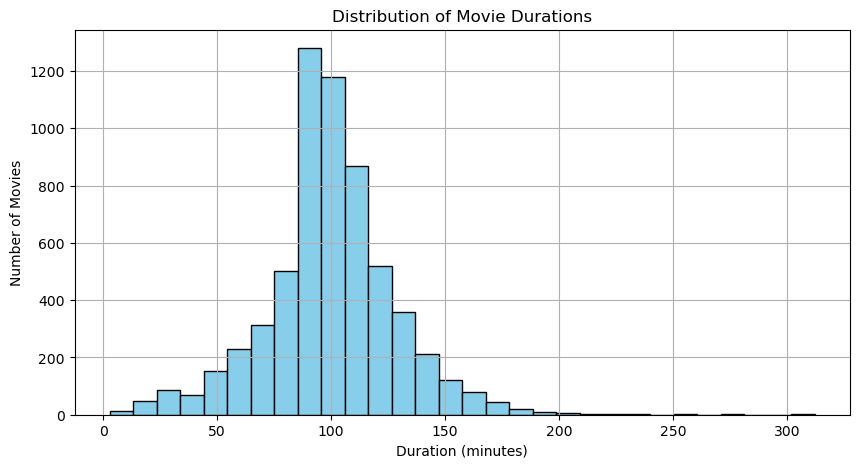

In [74]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.hist(movie_durations, bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Movie Durations')
plt.xlabel('Duration (minutes)')
plt.ylabel('Number of Movies')
plt.grid(True)
plt.show()

In [ ]:
#Reveals how movie lengths have changed over time.

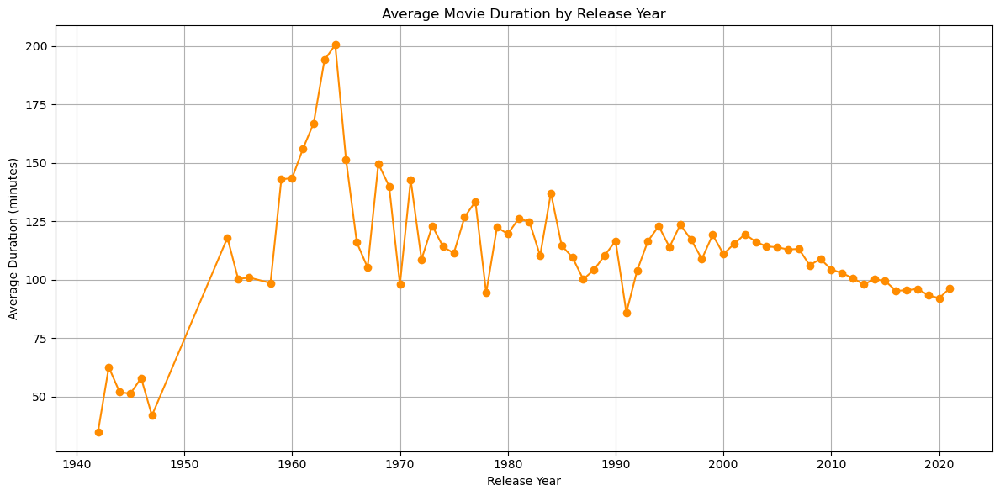

In [75]:
yearly_avg_df = df[df['duration_type'] == 'min'].groupby('release_year')['duration_value'].mean()

plt.figure(figsize=(12, 6))
yearly_avg_df.plot(kind='line', color='darkorange', marker='o')
plt.title('Average Movie Duration by Release Year')
plt.xlabel('Release Year')
plt.ylabel('Average Duration (minutes)')
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
Highlights median, quartiles, and outliers.

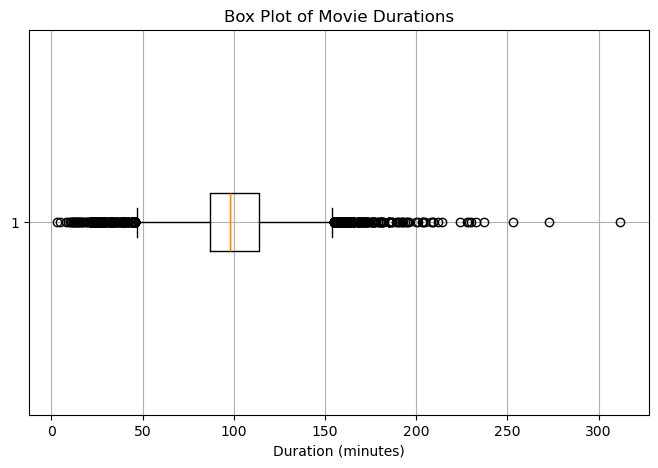

In [76]:
plt.figure(figsize=(8, 5))
plt.boxplot(movie_durations, vert=False)
plt.title('Box Plot of Movie Durations')
plt.xlabel('Duration (minutes)')
plt.grid(True)
plt.show()

In [ ]:
Top 10 Years by Movie Count :Shows which years had the most releases.


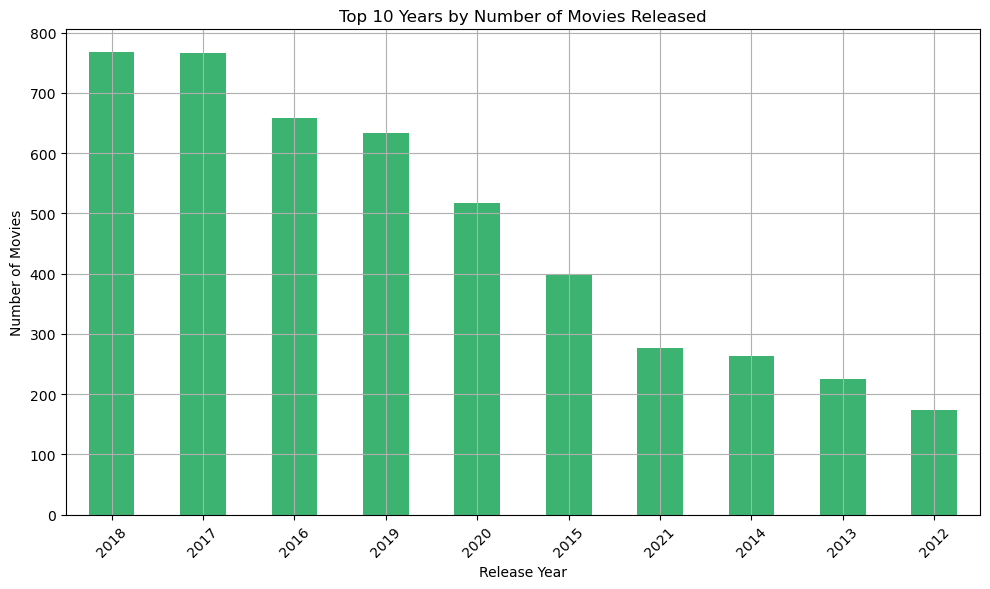

In [77]:
top_years = df[df['duration_type'] == 'min']['release_year'].value_counts().sort_values(ascending=False).head(10)

plt.figure(figsize=(10, 6))
top_years.plot(kind='bar', color='mediumseagreen')
plt.title('Top 10 Years by Number of Movies Released')
plt.xlabel('Release Year')
plt.ylabel('Number of Movies')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

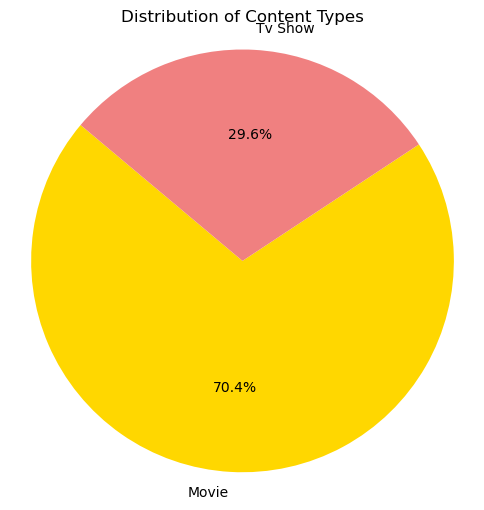

In [78]:
type_counts = df['type'].value_counts()

plt.figure(figsize=(6, 6))
plt.pie(type_counts, labels=type_counts.index, autopct='%1.1f%%', startangle=140, colors=['gold', 'lightcoral'])
plt.title('Distribution of Content Types')
plt.axis('equal')
plt.show()


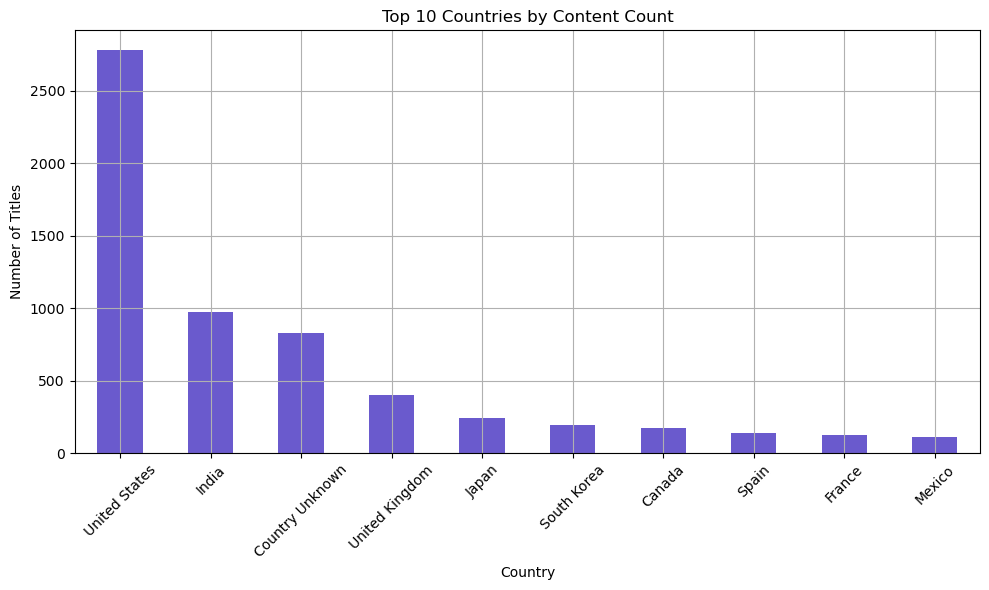

In [79]:
top_countries = df['country'].value_counts().head(10)

plt.figure(figsize=(10, 6))
top_countries.plot(kind='bar', color='slateblue')
plt.title('Top 10 Countries by Content Count')
plt.xlabel('Country')
plt.ylabel('Number of Titles')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

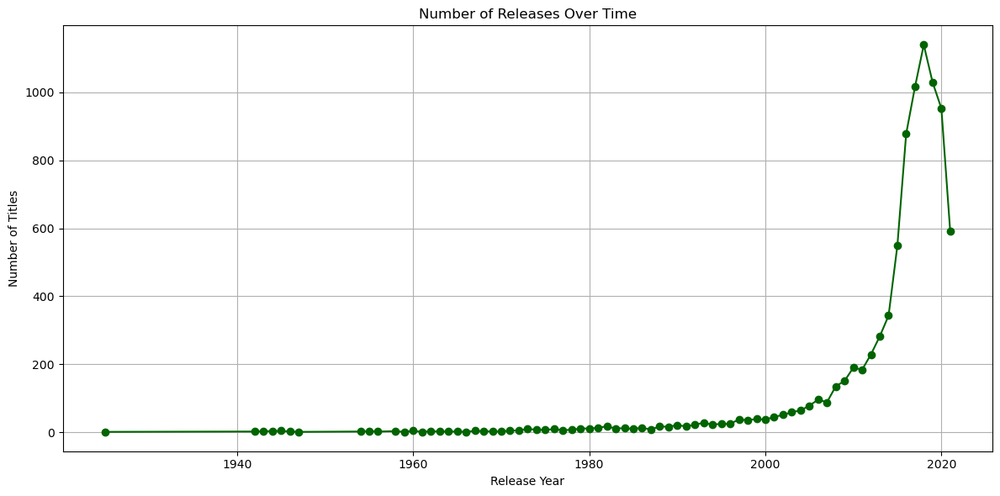

In [80]:
release_counts = df['release_year'].value_counts().sort_index()

plt.figure(figsize=(12, 6))
release_counts.plot(kind='line', color='darkgreen', marker='o')
plt.title('Number of Releases Over Time')
plt.xlabel('Release Year')
plt.ylabel('Number of Titles')
plt.grid(True)
plt.tight_layout()
plt.show()

<Figure size 1200x600 with 0 Axes>

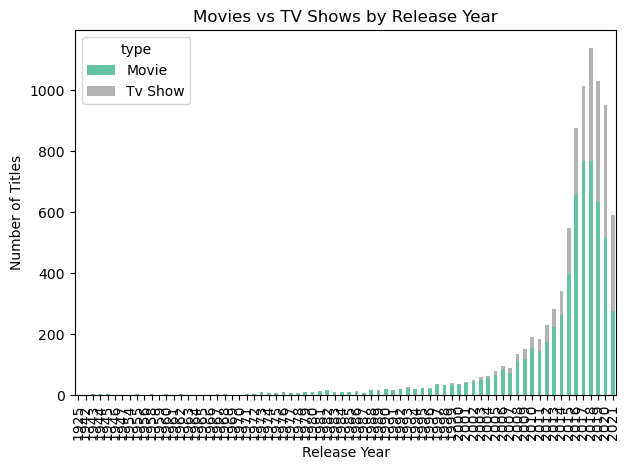

In [81]:
type_by_year = df.groupby(['release_year', 'type']).size().unstack(fill_value=0)

plt.figure(figsize=(12, 6))
type_by_year.plot(kind='bar', stacked=True, colormap='Set2')
plt.title('Movies vs TV Shows by Release Year')
plt.xlabel('Release Year')
plt.ylabel('Number of Titles')
plt.tight_layout()
plt.show()

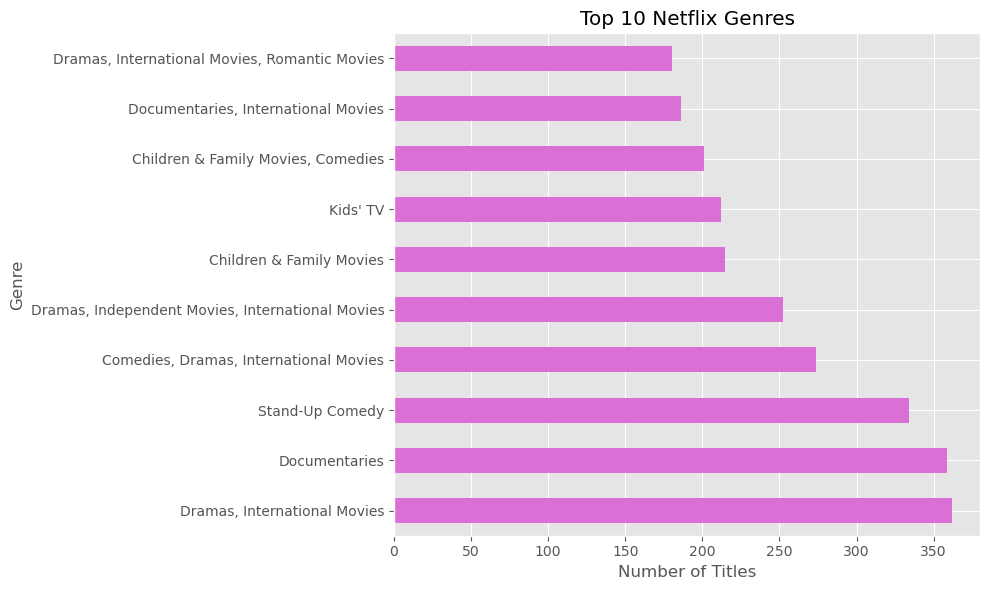

In [84]:
top_genres = df['listed_in'].value_counts().head(10)

plt.figure(figsize=(10, 6))
top_genres.plot(kind='barh', color='orchid')
plt.title('Top 10 Netflix Genres')
plt.xlabel('Number of Titles')
plt.ylabel('Genre')
plt.tight_layout()
plt.show()

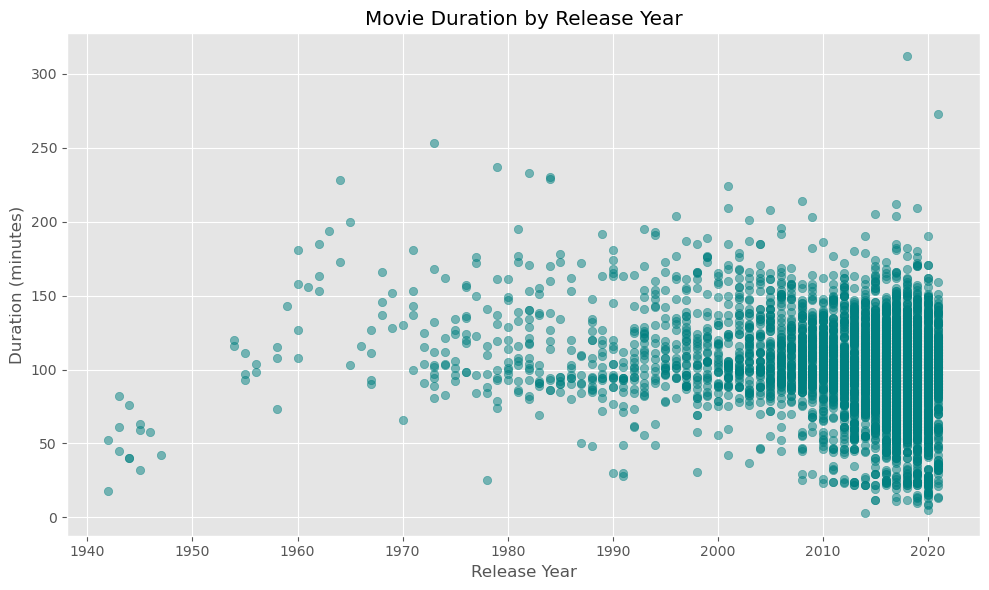

In [85]:
movies = df[df['duration_type'] == 'min']
plt.figure(figsize=(10, 6))
plt.scatter(movies['release_year'], movies['duration_value'], alpha=0.5, color='teal')
plt.title('Movie Duration by Release Year')
plt.xlabel('Release Year')
plt.ylabel('Duration (minutes)')
plt.grid(True)
plt.tight_layout()
plt.show()

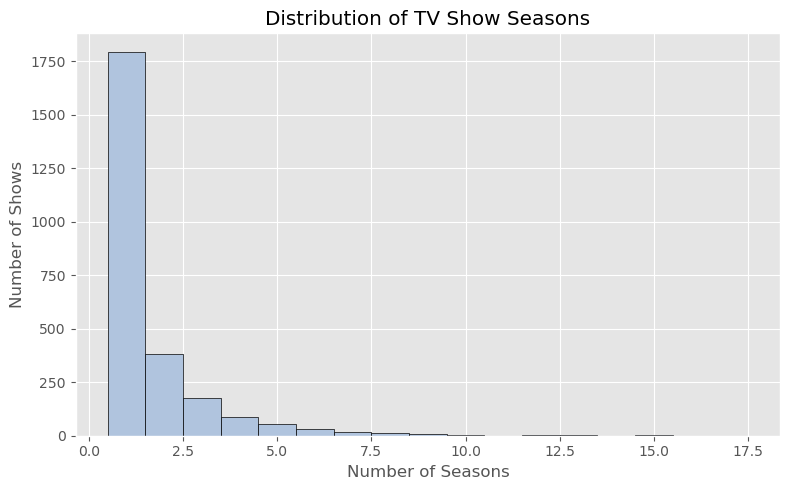

In [86]:
tv_seasons = df[df['duration_type'].str.contains('Season', na=False)]['duration_value'].astype(float)

plt.figure(figsize=(8, 5))
plt.hist(tv_seasons, bins=range(1, int(tv_seasons.max()) + 2), color='lightsteelblue', edgecolor='black', align='left')
plt.title('Distribution of TV Show Seasons')
plt.xlabel('Number of Seasons')
plt.ylabel('Number of Shows')
plt.tight_layout()
plt.show()

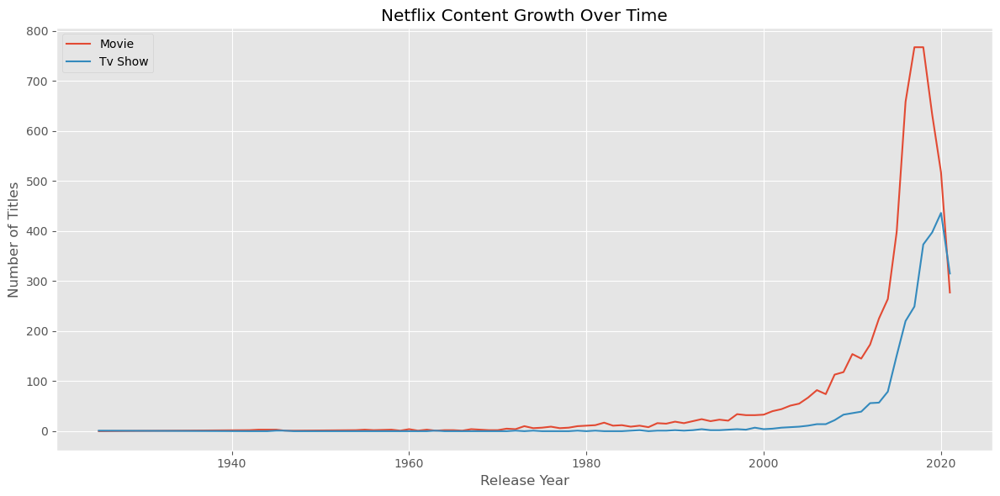

In [87]:
type_by_year = df.groupby(['release_year', 'type']).size().unstack(fill_value=0)

plt.figure(figsize=(12, 6))
for content_type in type_by_year.columns:
    plt.plot(type_by_year.index, type_by_year[content_type], label=content_type)

plt.title('Netflix Content Growth Over Time')
plt.xlabel('Release Year')
plt.ylabel('Number of Titles')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
seaborn

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt

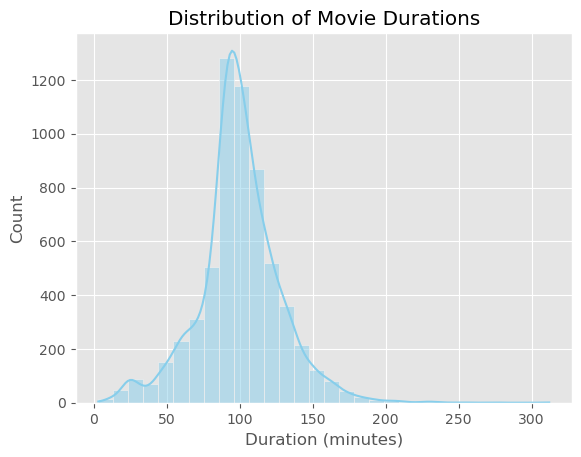

In [89]:
import seaborn as sns
import matplotlib.pyplot as plt
movies = df[df['duration_type'] == 'min']
sns.histplot(movies['duration_value'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Movie Durations')
plt.xlabel('Duration (minutes)')
plt.ylabel('Count')
plt.show()

C:\Users\HIMANSHU BHATT\AppData\Local\Temp\ipykernel_14988\3760193023.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df[df['duration_type'] == 'min'], x='type', y='duration_value', palette='Set2')


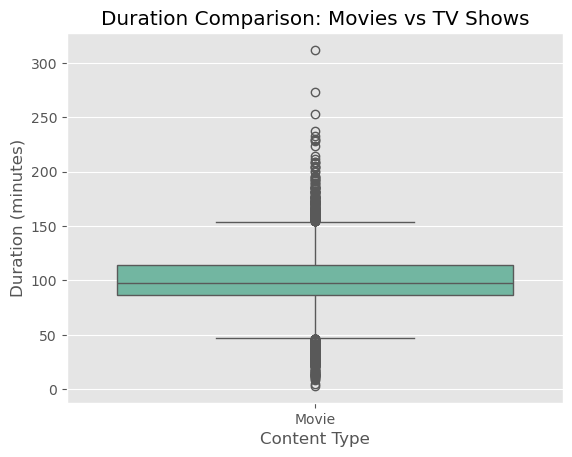

In [90]:
sns.boxplot(data=df[df['duration_type'] == 'min'], x='type', y='duration_value', palette='Set2')
plt.title('Duration Comparison: Movies vs TV Shows')
plt.xlabel('Content Type')
plt.ylabel('Duration (minutes)')
plt.show()

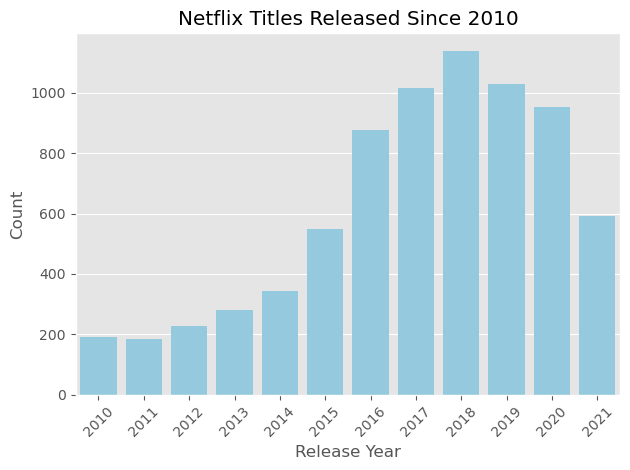

In [92]:
recent_years = df[df['release_year'] >= 2010]['release_year'].value_counts().sort_index()

sns.barplot(x=recent_years.index, y=recent_years.values, color='skyblue')
plt.title('Netflix Titles Released Since 2010')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

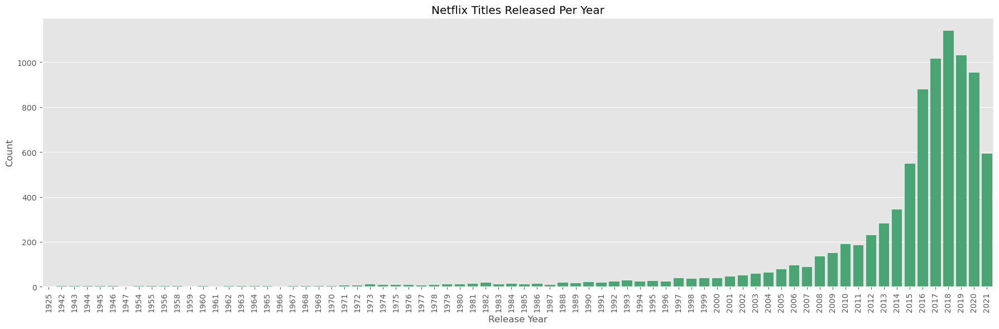

In [93]:
year_counts = df['release_year'].value_counts().sort_index()

plt.figure(figsize=(18, 6))  # Wider figure
sns.barplot(x=year_counts.index, y=year_counts.values, color='mediumseagreen')
plt.title('Netflix Titles Released Per Year')
plt.xlabel('Release Year')
plt.ylabel('Count')
plt.xticks(rotation=90)  # Rotate fully for spacing
plt.tight_layout()
plt.show()

C:\Users\HIMANSHU BHATT\AppData\Local\Temp\ipykernel_14988\3149021487.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_genres, x='Count', y='Genre', palette='mako')


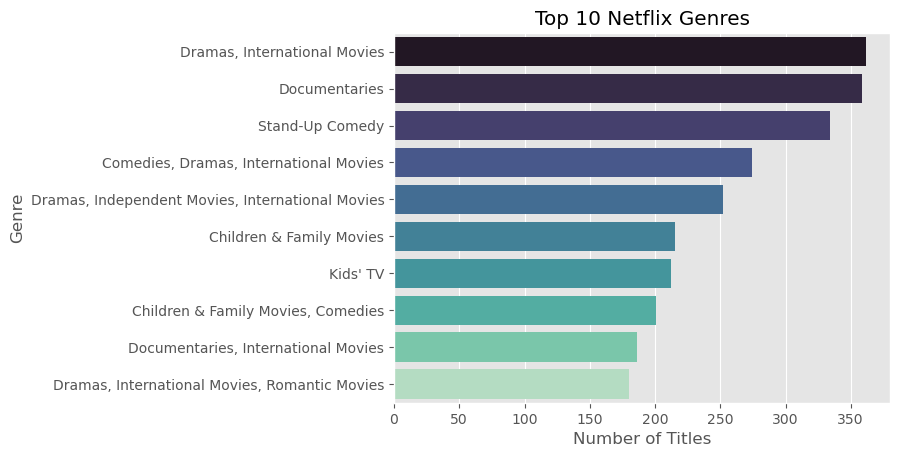

In [94]:
top_genres = df['listed_in'].value_counts().head(10).reset_index()
top_genres.columns = ['Genre', 'Count']

sns.barplot(data=top_genres, x='Count', y='Genre', palette='mako')
plt.title('Top 10 Netflix Genres')
plt.xlabel('Number of Titles')
plt.ylabel('Genre')
plt.show()

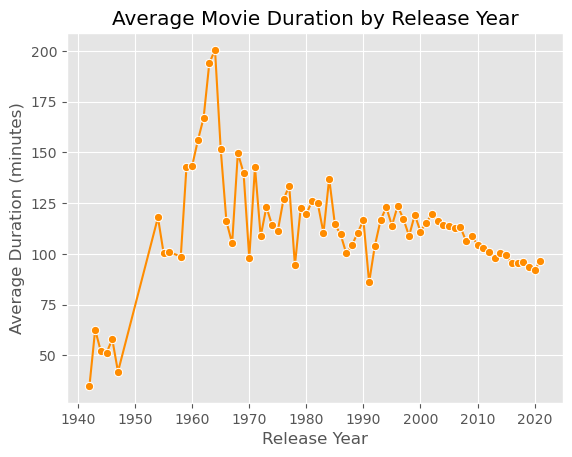

In [95]:
yearly_avg = df[df['duration_type'] == 'min'].groupby('release_year')['duration_value'].mean().reset_index()

sns.lineplot(data=yearly_avg, x='release_year', y='duration_value', marker='o', color='darkorange')
plt.title('Average Movie Duration by Release Year')
plt.xlabel('Release Year')
plt.ylabel('Average Duration (minutes)')
plt.grid(True)
plt.show()

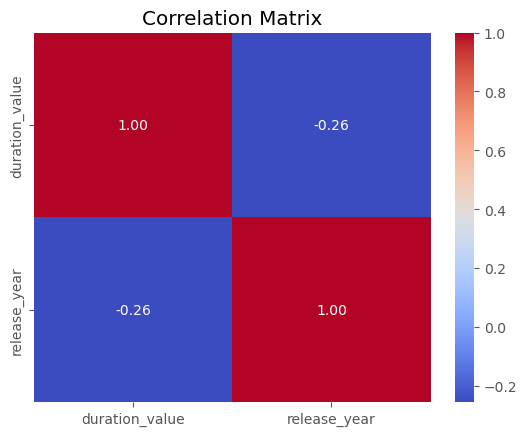

In [96]:
# Select numeric columns
numeric_df = df[['duration_value', 'release_year']].dropna()

# Compute correlation matrix
corr = numeric_df.corr()

# Plot heatmap
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

C:\Users\HIMANSHU BHATT\AppData\Local\Temp\ipykernel_14988\3025410921.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df[df['duration_type'] == 'min'], x='type', y='duration_value', palette='pastel')


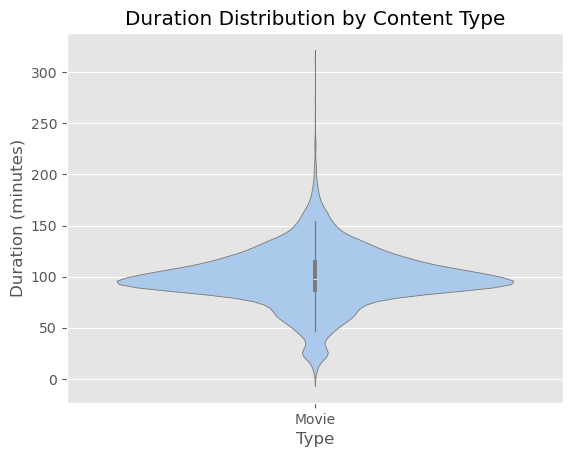

In [97]:
sns.violinplot(data=df[df['duration_type'] == 'min'], x='type', y='duration_value', palette='pastel')
plt.title('Duration Distribution by Content Type')
plt.xlabel('Type')
plt.ylabel('Duration (minutes)')
plt.show()

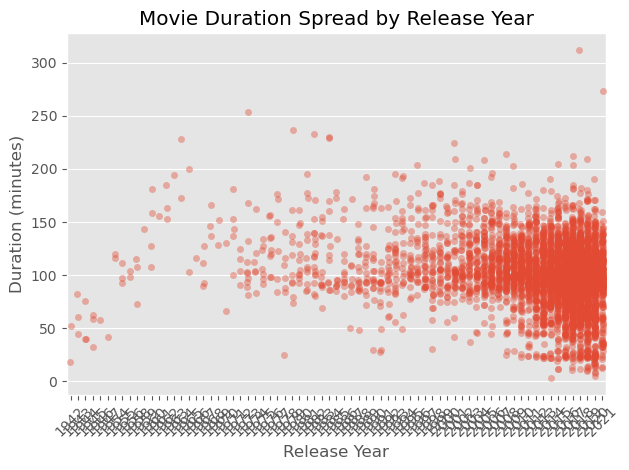

In [98]:
sns.stripplot(data=df[df['duration_type'] == 'min'], x='release_year', y='duration_value', alpha=0.4, jitter=True)
plt.title('Movie Duration Spread by Release Year')
plt.xlabel('Release Year')
plt.ylabel('Duration (minutes)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

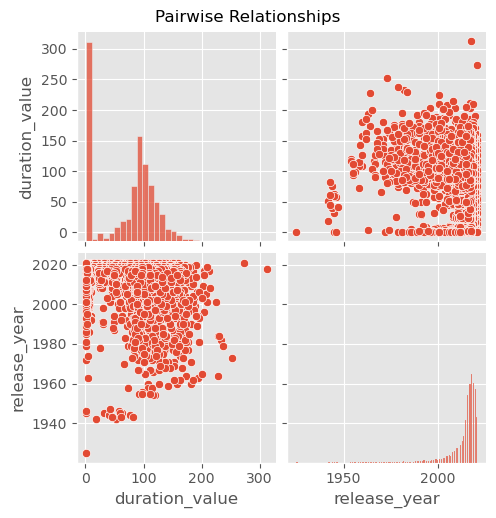

In [103]:
sns.pairplot(df[['duration_value', 'release_year']].dropna())
plt.suptitle('Pairwise Relationships', y=1.02)
plt.show()

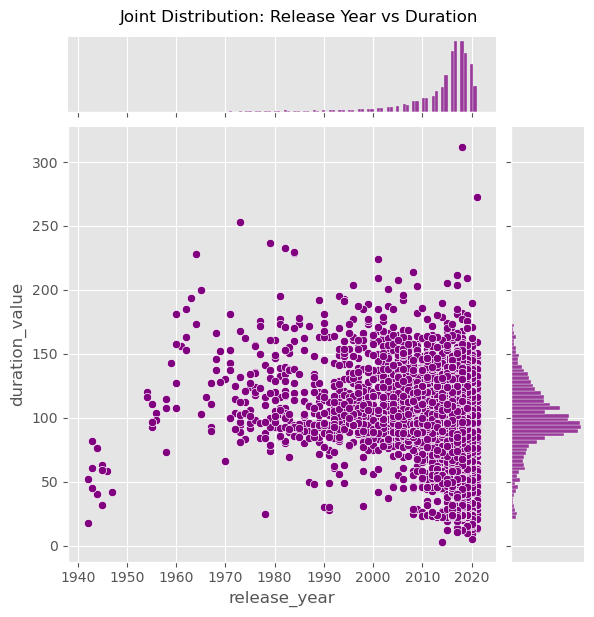

In [104]:
sns.jointplot(data=df[df['duration_type'] == 'min'], x='release_year', y='duration_value', kind='scatter', color='purple')
plt.suptitle('Joint Distribution: Release Year vs Duration', y=1.02)
plt.show()

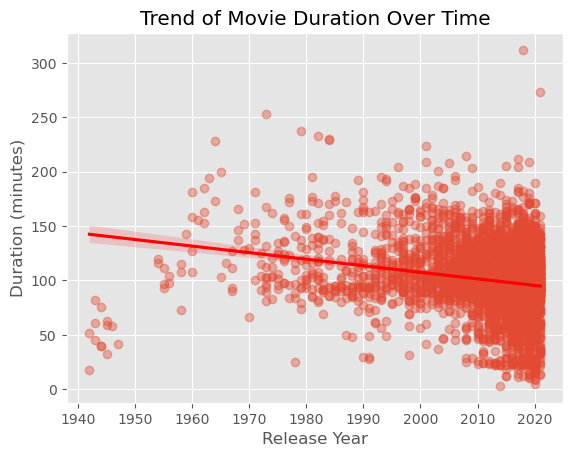

In [105]:
sns.regplot(data=df[df['duration_type'] == 'min'], x='release_year', y='duration_value', scatter_kws={'alpha':0.4}, line_kws={'color':'red'})
plt.title('Trend of Movie Duration Over Time')
plt.xlabel('Release Year')
plt.ylabel('Duration (minutes)')
plt.show()

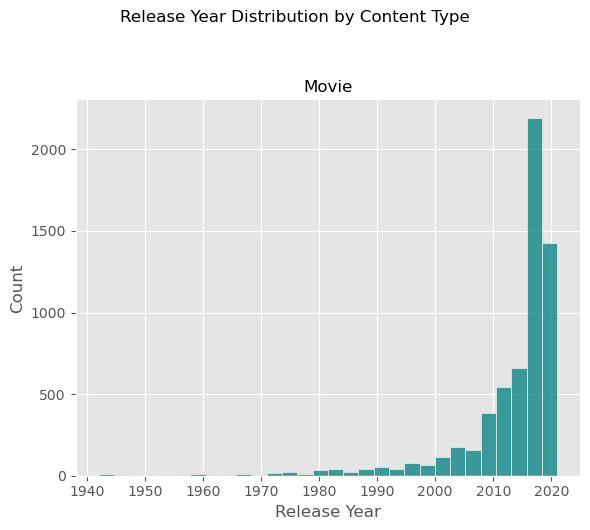

In [106]:
g = sns.FacetGrid(df[df['duration_type'] == 'min'], col='type', height=5, aspect=1.2)
g.map(sns.histplot, 'release_year', bins=30, color='teal')
g.set_titles('{col_name}')
g.set_axis_labels('Release Year', 'Count')
plt.suptitle('Release Year Distribution by Content Type', y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
# Statistics 

In [108]:
#Descriptive Statistics
#describe() to summarize numeric columns like duration_value and release_year.
df['duration_value'].describe()




count    8706.000000
mean       70.590627
std        50.610750
min         1.000000
25%         3.000000
50%        89.000000
75%       106.000000
max       312.000000
Name: duration_value, dtype: float64

In [109]:
# frequency distribution
df['type'].value_counts(normalize=True)  # Proportion of Movies vs TV Shows
df['rating'].value_counts()              # Frequency of content ratings


rating
TV-MA        3183
TV-14        2133
TV-PG         838
R             799
PG-13         490
TV-Y7         330
TV-Y          300
PG            287
TV-G          212
NR             78
G              41
TV-Y7-FV        5
NOT RATED       4
NC-17           3
UR              3
74 MIN          1
84 MIN          1
66 MIN          1
Name: count, dtype: int64

In [110]:
# correlation anlysis
df[['release_year', 'duration_value']].corr()

,release_year,duration_value
release_year,1.00000,-0.25509
duration_value,-0.25509,1.00000


In [111]:
# grouped stastics
df.groupby('type')['duration_value'].mean()  # Avg duration for Movies vs TV Shows
df.groupby('release_year')['duration_value'].mean()  # Avg duration by year

release_year
1925     1.000000
1942    35.000000
1943    62.666667
1944    52.000000
1945    38.750000
          ...    
2017    72.521182
2018    65.254386
2019    58.161165
2020    50.769150
2021    46.040541
Name: duration_value, Length: 74, dtype: float64

In [117]:
from scipy.stats import zscore

df['z_duration'] = zscore(df['duration_value'])
outliers = df[df['z_duration'].abs() > 3]  # More realistic threshold

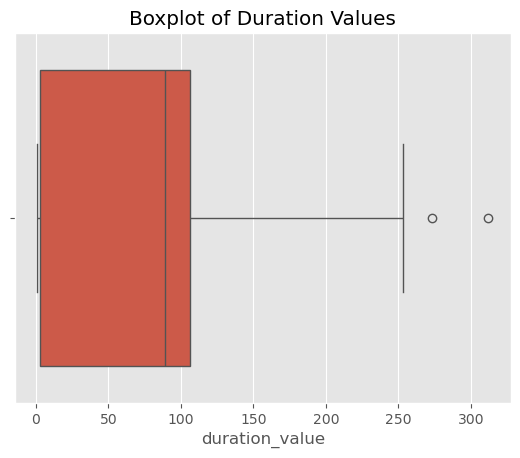

In [118]:
import seaborn as sns
sns.boxplot(x=df['duration_value'])
plt.title('Boxplot of Duration Values')
plt.show()

In [126]:
import pandas as pd
from scipy.stats import ttest_ind

# Ensure duration_value is numeric
df['duration_value'] = pd.to_numeric(df['duration_value'], errors='coerce')

# Filter and clean data
movies = df[df['type'] == 'Movie']['duration_value'].dropna()
shows = df[df['type'] == 'TV Show']['duration_value'].dropna()

# Check if both groups have data
if len(movies) > 0 and len(shows) > 0:
    # Run t-test
    stat, p = ttest_ind(movies, shows)
    
    # Print results
    print(f"T-statistic: {stat:.2f}")
    print(f"P-value: {p:.4f}")
    
    # Interpretation
    if p < 0.05:
        print(" There is a significant difference in duration between Movies and TV Shows.")
    else:
        print("No significant difference in duration between Movies and TV Shows.")
else:
    print("One of the groups is empty. Cannot perform t-test.")

One of the groups is empty. Cannot perform t-test.


In [140]:
pd.crosstab(df['type'], df['rating'])

rating,66 MIN,74 MIN,84 MIN,G,NC-17,NOT RATED,NR,PG,PG-13,R,TV-14,TV-G,TV-MA,TV-PG,TV-Y,TV-Y7,TV-Y7-FV,UR
type,,,,,,,,,,,,,,,,,,
Movie,1,1,1,41,3,2,75,287,490,797,1427,126,2062,540,131,139,5,3
Tv Show,0,0,0,0,0,2,3,0,0,2,706,86,1121,298,169,191,0,0


In [141]:
from scipy.stats import chi2_contingency

table = pd.crosstab(df['type'], df['rating'])
chi2, p, dof, expected = chi2_contingency(table)
print(f"Chi-square: {chi2:.2f}, p-value: {p:.4f}")

Chi-square: 1022.50, p-value: 0.0000


In [142]:
# regression
import statsmodels.api as sm

X = df[['release_year']]
y = df['duration_value']
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:         duration_value   R-squared:                         nan
Model:                            OLS   Adj. R-squared:                    nan
Method:                 Least Squares   F-statistic:                       nan
Date:                Wed, 08 Oct 2025   Prob (F-statistic):                nan
Time:                        17:32:01   Log-Likelihood:                    nan
No. Observations:                8709   AIC:                               nan
Df Residuals:                    8707   BIC:                               nan
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const               nan        nan        nan   

<Axes: xlabel='year_added'>

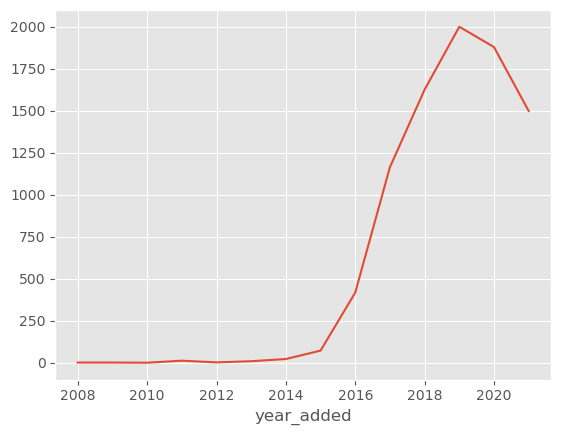

In [145]:

# time series analysis
df['date_added'] = pd.to_datetime(df['date_added'])
df['year_added'] = df['date_added'].dt.year

df['year_added'].value_counts().sort_index().plot(kind='line')

In [146]:
from scipy.stats import f_oneway

groups = [group['duration_value'].dropna() for name, group in df.groupby('rating')]
f_stat, p_val = f_oneway(*groups)
print(f"F-statistic: {f_stat:.2f}, p-value: {p_val:.4f}")

F-statistic: nan, p-value: nan


C:\Users\HIMANSHU BHATT\anaconda3\Lib\site-packages\scipy\stats\_stats_py.py:4102: DegenerateDataWarning: at least one input has length 0
  if _f_oneway_is_too_small(samples):


In [147]:
from scipy.stats import f_oneway

# Filter out empty groups
groups = [
    group['duration_value'].dropna()
    for name, group in df.groupby('rating')
    if group['duration_value'].dropna().shape[0] >= 2  # Keep only groups with 2+ values
]

# Run ANOVA only if we have enough valid groups
if len(groups) >= 2:
    f_stat, p_val = f_oneway(*groups)
    print(f"F-statistic: {f_stat:.2f}")
    print(f"P-value: {p_val:.4f}")
    
    if p_val < 0.05:
        print("Significant difference in duration across ratings.")
    else:
        print("No significant difference in duration across ratings.")
else:
    print("Not enough valid rating groups to perform ANOVA.")

F-statistic: 123.07
P-value: 0.0000
Significant difference in duration across ratings.


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:00<00:00, 36.69it/s][A


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

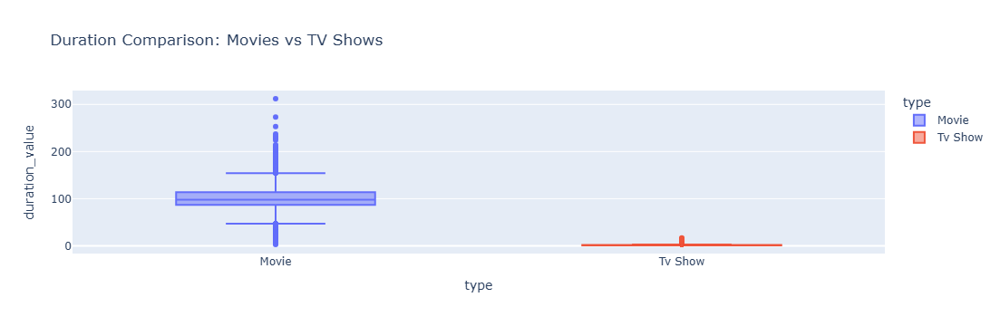

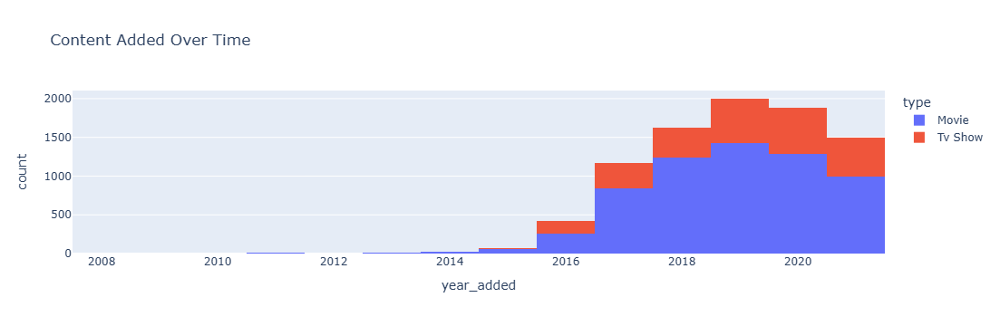

One of the groups is empty. Cannot perform t-test.
ANOVA → F-statistic: 123.07, P-value: 0.0000
Significant difference in duration across ratings.


ValueError: The indices for endog and exog are not aligned

In [149]:

import pandas as pd
import plotly.express as px
from ydata_profiling import ProfileReport
from scipy.stats import ttest_ind, f_oneway
import statsmodels.api as sm


# df = pd.read_csv('netflix_titles.csv')  # Uncomment if loading from file

# 🧼 Clean Data
df['duration_value'] = pd.to_numeric(df['duration_value'], errors='coerce')
df['date_added'] = pd.to_datetime(df['date_added'], errors='coerce')
df['release_year'] = pd.to_numeric(df['release_year'], errors='coerce')

# 1. YData Profiling Report
profile = ProfileReport(df, title="Netflix Dataset Profiling", explorative=True)
profile.to_notebook_iframe()  # Or use profile.to_file("netflix_profile.html")

# 2. Plotly Visualizations

# Boxplot: Duration by Type
fig1 = px.box(df, x='type', y='duration_value', color='type',
              title='Duration Comparison: Movies vs TV Shows')
fig1.show()

# Histogram: Titles Added Over Time
df['year_added'] = df['date_added'].dt.year
fig2 = px.histogram(df, x='year_added', color='type', nbins=20,
                    title='Content Added Over Time')
fig2.show()

# 3. T-Test: Movie vs TV Show Duration
movies = df[df['type'] == 'Movie']['duration_value'].dropna()
shows = df[df['type'] == 'TV Show']['duration_value'].dropna()

if len(movies) > 0 and len(shows) > 0:
    stat, p = ttest_ind(movies, shows)
    print(f"T-Test → T-statistic: {stat:.2f}, P-value: {p:.4f}")
    if p < 0.05:
        print("Significant difference in duration between Movies and TV Shows.")
    else:
        print("No significant difference in duration between Movies and TV Shows.")
else:
    print("One of the groups is empty. Cannot perform t-test.")

#  4. ANOVA: Duration Across Ratings
groups = [group['duration_value'].dropna()
          for name, group in df.groupby('rating')
          if group['duration_value'].dropna().shape[0] >= 2]

if len(groups) >= 2:
    f_stat, p_val = f_oneway(*groups)
    print(f"ANOVA → F-statistic: {f_stat:.2f}, P-value: {p_val:.4f}")
    if p_val < 0.05:
        print("Significant difference in duration across ratings.")
    else:
        print(" No significant difference in duration across ratings.")
else:
    print("Not enough valid rating groups to perform ANOVA.")

#  5. Linear Regression: Predict Duration from Release Year
X = df[['release_year']].dropna()
y = df['duration_value'].dropna()
X = sm.add_constant(X)

model = sm.OLS(y[:len(X)], X).fit()
print(model.summary())